<a href="https://colab.research.google.com/github/YuqiYuqiMa/Enhanced-Face-Recognition-for-Surveillance-Systems/blob/main/Super_resolution_comparison.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Mickaël Tits - CETIC asbl - https://www.cetic.be/Mickael-Tits?lang=fr - 03/07/2019

Copyright: CETIC asbl - 2019

License: [CC BY 2.0 BE](https://creativecommons.org/licenses/by/2.0/be/)

# FR - Notes d'introduction

Ce notebook accompagne et illustre l'article sur la super-résolution suivant, publié par le CETIC dans le cadre de la [Deep Learning Academy](https://deep-learning-academy.github.io/): https://docs.google.com/document/d/1XUFQAgdzNDIg7zXevipnMst7eMTujhB0y_XNJYEhWgY/edit?usp=sharing

Les images de tests sont placées dans le dossier '/content/MyImages'.

Les résultats obtenus par les différents modèles sont placés dans le dossier: '/content/MyResults'.

Vous pouvez décommenter certaines lignes pour charger et tester plus de modèles.

## Notes additionnelles si vous voulez tester les modèles sur vos propres images

Des images valides pour la plupart des algorithmes sont le format .PNG. La taille des images prises en charge par les modèles dépend du GPU, du modèle testé et des options de super-résolution.

Certains des algorithmes permettant une stratégie de découpage de l'image d'entrée pour permettre de traiter des images plus grandes. Les images de taille 500x500 pixels devraient fonctionner dans la pulpart des cas dans Google Colab si vous avez la chance d'avoir un GPU Tesla T4 assigné à votre session,les images devront être un peu réduites pour utilisation avec une K80. Les images de l'ordre de 1000x1000 ne fonctionneront pas avec certains modèles, plus particulièrement ceux proposant un grand taux d'agrandissement (x8). Pour ceux qui veulent s'y essayer, cela pourrait cependant fonctionner avec les modèles SRFBN x4, WDSR x4 et DBPN x4.

# EN - Introduction notes
Test images will be put in folder '/content/MyImages'.

Model outputs will be put in folder '/content/MyResults'.

You can uncomment some lines to download and test more models.

## Notes if you want to try with your own images

Acceptable images for most algorithms should be in png format. The acceptable size depends on your GPU, on the model you are trying and on the scaling option.

Note that some algorithms allow chopping strategy to allow the use of larger images. Images around 500x500 should work in most cases with Google colab Tesla T4, maybe not with K80. Images around 1000x1000 won't work with some models, especially with a very large scaling option (like x8). It could work with SRFBN x4, WDSR x4 and DBPN x4.

In [ ]:
!nvidia-smi

In [ ]:
!pip install scipy==1.0.0
#if it is asked, you should restart runtime after this installation


     |████████████████████████████████| 50.0MB 1.6MB/s 
ERROR: cvxpy 1.0.25 has requirement scipy>=1.1.0, but you'll have scipy 1.0.0 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: scipy 1.3.2
    Uninstalling scipy-1.3.2:
      Successfully uninstalled scipy-1.3.2


In [ ]:
import os
os.chdir('/content/')
!rm -r '/content/MyImages'
!mkdir '/content/MyImages'

In [ ]:
import os
os.chdir('/content/')
!rm -r '/content/Myresults'
!mkdir '/content/Myresults'

rm: cannot remove '/content/Myresults': No such file or directory


In [ ]:
#Download imges from git repo:
import os
os.chdir('/content/')
!git clone "https://github.com/titsitits/Test_images_superresolution"

os.chdir("/content/Test_images_superresolution/")
filenames = os.listdir()
for filename in filenames:
  os.rename(filename, filename.lower())

!cp /content/Test_images_superresolution/*.{jpg,png,JPG,PNG} /content/MyImages
!rm -r /content/Test_images_superresolution/

#You could also add your own images. However, note that some of the tested methods are capricious (particularly SRFBN) and do not work with all images.


Cloning into 'Test_images_superresolution'...
remote: Enumerating objects: 145, done.
remote: Counting objects: 100% (145/145), done.
remote: Compressing objects: 100% (136/136), done.
remote: Total 145 (delta 23), reused 83 (delta 5), pack-reused 0
Receiving objects: 100% (145/145), 67.29 MiB | 8.64 MiB/s, done.
Resolving deltas: 100% (23/23), done.
cp: cannot stat '/content/Test_images_superresolution/*.png': No such file or directory
cp: cannot stat '/content/Test_images_superresolution/*.JPG': No such file or directory
cp: cannot stat '/content/Test_images_superresolution/*.PNG': No such file or directory


In [ ]:
#convert all images from /content/MyImages in a compatible format for most models 
from PIL import Image
import glob
for myfile in glob.glob('/content/MyImages/*'):
  f, e = os.path.splitext(myfile)
  myim = Image.open(myfile)
  os.remove(myfile)
  myim.save(f+".png")

# WDSR - EDSR - SRGAN - "Keras-based implementation of WDSR, EDSR and SRGAN for single image super-resolution "
https://github.com/krasserm/super-resolution

   - Wide Activation for Efficient and Accurate Image Super-Resolution (WDSR), winner of the NTIRE 2018 super-resolution challenge.
   - Enhanced Deep Residual Networks for Single Image Super-Resolution (EDSR), winner of the NTIRE 2017 super-resolution challenge.
   - Photo-Realistic Single Image Super-Resolution Using a Generative Adversarial Network (SRGAN).


In [ ]:
#Download github repository
import os
os.chdir('/content')
!git clone "https://github.com/krasserm/super-resolution"

Cloning into 'super-resolution'...
remote: Enumerating objects: 80, done.
remote: Counting objects: 100% (80/80), done.
remote: Compressing objects: 100% (55/55), done.
remote: Total 317 (delta 42), reused 58 (delta 25), pack-reused 237
Receiving objects: 100% (317/317), 31.92 MiB | 46.69 MiB/s, done.
Resolving deltas: 100% (164/164), done.


In [ ]:
#Download models
import os
os.chdir('/content/super-resolution/model')

#baseline (EDSR)
#!wget -O 'edsr-16-x2-psnr-34.6356.h5' --no-check-certificate "https://docs.google.com/uc?export=download&id=1oATD-iXlQpcE2mIIEd4-9FOk2Xt5N8oX"
#lightest model
#!wget -O 'wdsr-a-16-x2-psnr-34.6816.h5' --no-check-certificate "https://docs.google.com/uc?export=download&id=1WmuSpNamFSszQOafrno05o1nDN4QjMeq"
#best PSNR
#!wget -O 'wdsr-a-32-x2-psnr-34.8033.h5' --no-check-certificate "https://docs.google.com/uc?export=download&id=1V4XHMFZo35yB_NTaD0dyw1_plS-78-Ju"
!wget -O 'wdsr-a-32-x4-psnr-29.1736.h5' --no-check-certificate "https://docs.google.com/uc?export=download&id=1ZTIz1YVXFTI2z3rvBfVuBSthJLJZivxC"
#srgan with edsr generator (pre-trained and fine-tuned) (edsr gives the psnr, the gan ensures the photo is realistic)
#!wget -O 'edsr-16-x4-gen-pre-psnr-28.8885.h5' --no-check-certificate "https://docs.google.com/uc?export=download&id=1V4XHMFZo35yB_NTaD0dyw1_plS-78-Ju"
!wget -O 'edsr-16-x4-gen-epoch-088.h5' --no-check-certificate "https://docs.google.com/uc?export=download&id=1Z7PhioyvTzLBOdrg6c4RNEP9JEIqudwP"


os.chdir('../')

--2019-08-15 20:40:41--  https://docs.google.com/uc?export=download&id=1ZTIz1YVXFTI2z3rvBfVuBSthJLJZivxC
Resolving docs.google.com (docs.google.com)... 74.125.141.100, 74.125.141.101, 74.125.141.113, ...
Connecting to docs.google.com (docs.google.com)|74.125.141.100|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-10-7s-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/cmjcderggm1hkd3fcd025lna77p5spah/1565899200000/06411213533590006419/*/1ZTIz1YVXFTI2z3rvBfVuBSthJLJZivxC?e=download [following]
--2019-08-15 20:40:45--  https://doc-10-7s-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/cmjcderggm1hkd3fcd025lna77p5spah/1565899200000/06411213533590006419/*/1ZTIz1YVXFTI2z3rvBfVuBSthJLJZivxC?e=download
Resolving doc-10-7s-docs.googleusercontent.com (doc-10-7s-docs.googleusercontent.com)... 74.125.141.132, 2607:f8b0:400c:c06::84
Connecting to doc-10-7s-docs.googleusercontent.com (doc-10-7s-d

In [ ]:
#Apply models on test images
import os
os.chdir('/content/super-resolution')

#uncomment to test
#!python demo.py -i /content/MyImages -o ./output_edsr_x2 --model ./model/edsr-16-x2-psnr-34.6356.h5
#!mkdir -p /content/Myresults/output_edsr_x2/
#!cp ./output_edsr_x2/*.png /content/Myresults/output_edsr_x2/

#uncomment to test
#!python demo.py -i /content/MyImages -o ./output_wdsr_x2 --model ./model/wdsr-a-16-x2-psnr-34.6816.h5
#!mkdir -p /content/Myresults/output_wdsr_x2/
#!cp ./output_wdsr_x2/*.png /content/Myresults/output_wdsr_x2/

!python demo.py -i /content/MyImages -o ./output_wdsr_x4 --model ./model/wdsr-a-32-x4-psnr-29.1736.h5
!mkdir -p /content/Myresults/output_wdsr_x4/
!cp ./output_wdsr_x4/*.png /content/Myresults/output_wdsr_x4/

!python demo.py -i /content/MyImages -o ./srgan_x4 --model ./model/edsr-16-x4-gen-epoch-088.h5
!mkdir -p /content/Myresults/srgan_x4/
!cp ./srgan_x4/*.png /content/Myresults/srgan_x4/

Using TensorFlow backend.
W0815 20:40:57.589903 140008539113344 deprecation_wrapper.py:119] From /content/super-resolution/util.py:30: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto instead.

W0815 20:40:57.590189 140008539113344 deprecation_wrapper.py:119] From /content/super-resolution/util.py:33: The name tf.Session is deprecated. Please use tf.compat.v1.Session instead.

2019-08-15 20:40:57.606756: I tensorflow/core/platform/profile_utils/cpu_utils.cc:94] CPU Frequency: 2300000000 Hz
2019-08-15 20:40:57.606964: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x1c0b480 executing computations on platform Host. Devices:
2019-08-15 20:40:57.606996: I tensorflow/compiler/xla/service/service.cc:175]   StreamExecutor device (0): <undefined>, <undefined>
2019-08-15 20:40:57.608847: I tensorflow/stream_executor/platform/default/dso_loader.cc:42] Successfully opened dynamic library libcuda.so.1
2019-08-15 20:40:57.771401: I tensorflow/stream_executor

# Enhanced SRGAN
https://github.com/xinntao/ESRGAN


In [ ]:
#Download github repository
import os
os.chdir('/content')
!git clone https://github.com/xinntao/ESRGAN

Cloning into 'ESRGAN'...
remote: Enumerating objects: 207, done.
remote: Total 207 (delta 0), reused 0 (delta 0), pack-reused 207
Receiving objects: 100% (207/207), 24.85 MiB | 43.13 MiB/s, done.
Resolving deltas: 100% (74/74), done.


In [ ]:
#Download models
import os
os.chdir('/content/ESRGAN')
#old architecture
#!wget -O './models/RRDB_ESRGAN_x4.pth' --no-check-certificate 'https://docs.google.com/uc?export=download&id=1MJFgqXJrMkPdKtiuy7C6xfsU1QIbXEb-'
#!wget -O './models/RRDB_PSNR_x4.pth' --no-check-certificate 'https://docs.google.com/uc?export=download&id=1mSJ6Z40weL-dnPvi390xDd3uZBCFMeqr'
#convert models for new architecture
#!python transer_RRDB_models.py

#or download new architecture
!wget -O './models/RRDB_ESRGAN_x4.pth' --no-check-certificate 'https://docs.google.com/uc?export=download&id=1TPrz5QKd8DHHt1k8SRtm6tMiPjz_Qene'
!wget -O './models/RRDB_PSNR_x4.pth' --no-check-certificate 'https://docs.google.com/uc?export=download&id=1pJ_T-V1dpb1ewoEra1TGSWl5e6H7M4NN'


--2019-08-15 20:41:53--  https://docs.google.com/uc?export=download&id=1TPrz5QKd8DHHt1k8SRtm6tMiPjz_Qene
Resolving docs.google.com (docs.google.com)... 74.125.141.139, 74.125.141.102, 74.125.141.113, ...
Connecting to docs.google.com (docs.google.com)|74.125.141.139|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0k-4k-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/87lpgp79s99seqap0c8ktn19b0lecrqj/1565899200000/15659024415184981874/*/1TPrz5QKd8DHHt1k8SRtm6tMiPjz_Qene?e=download [following]
--2019-08-15 20:41:55--  https://doc-0k-4k-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/87lpgp79s99seqap0c8ktn19b0lecrqj/1565899200000/15659024415184981874/*/1TPrz5QKd8DHHt1k8SRtm6tMiPjz_Qene?e=download
Resolving doc-0k-4k-docs.googleusercontent.com (doc-0k-4k-docs.googleusercontent.com)... 74.125.141.132, 2607:f8b0:400c:c06::84
Connecting to doc-0k-4k-docs.googleusercontent.com (doc-0k-4k-d

In [ ]:
#Apply models on test images
!mkdir -p /content/ESRGAN/LR/
!cp /content/MyImages/*.png /content/ESRGAN/LR/

import os
os.chdir('/content/ESRGAN')

#more realistic image (gan)
!python test.py models/RRDB_ESRGAN_x4.pth
!mkdir -p /content/Myresults/ESRGAN_x4/
!cp /content/ESRGAN/results/*.png /content/Myresults/ESRGAN_x4/

#closer to original image (psnr max)
!python test.py models/RRDB_PSNR_x4.pth
!mkdir -p /content/Myresults/ESRGAN_PSNR_x4/
!cp /content/ESRGAN/results/*.png /content/Myresults/ESRGAN_PSNR_x4/

#create interpolation between both network (0.8 esrgan + 0.2 psnr)
!python net_interp.py 0.8
!python test.py models/interp_08.pth
!mkdir -p /content/Myresults/ESRGAN_INTERP_x4/
!cp /content/ESRGAN/results/*.png /content/Myresults/ESRGAN_INTERP_x4/

Model path models/RRDB_ESRGAN_x4.pth. 
Testing...
1 comic
2 baboon
3 67941865_400675040816897_2450782599082147840_n
Model path models/RRDB_ESRGAN_x4.pth. 
Testing...
1 comic
2 baboon
3 67941865_400675040816897_2450782599082147840_n
Traceback (most recent call last):
  File "net_interp.py", line 11, in <module>
    net_PSNR = torch.load(net_PSNR_path)
  File "/usr/local/lib/python3.6/dist-packages/torch/serialization.py", line 387, in load
    return _load(f, map_location, pickle_module, **pickle_load_args)
  File "/usr/local/lib/python3.6/dist-packages/torch/serialization.py", line 564, in _load
    magic_number = pickle_module.load(f, **pickle_load_args)
_pickle.UnpicklingError: invalid load key, '<'.
Model path models/RRDB_ESRGAN_x4.pth. 
Testing...
1 comic
2 baboon
3 67941865_400675040816897_2450782599082147840_n


# DBPN - Deep Back-Projection Networks for Super-Resolution (CVPR2018)
https://github.com/alterzero/DBPN-Pytorch

In [ ]:
#Download github repository
import os
os.chdir('/content')
!git clone "https://github.com/alterzero/DBPN-Pytorch"

Cloning into 'DBPN-Pytorch'...
remote: Enumerating objects: 15, done.
remote: Counting objects: 100% (15/15), done.
remote: Compressing objects: 100% (13/13), done.
remote: Total 217 (delta 7), reused 7 (delta 2), pack-reused 202
Receiving objects: 100% (217/217), 443.38 MiB | 39.41 MiB/s, done.
Resolving deltas: 100% (100/100), done.
Checking out files: 100% (41/41), done.


In [ ]:
#Download models
import os
os.chdir('/content/DBPN-Pytorch')
#!wget --no-check-certificate -O DBPN_x2.pth "https://docs.google.com/uc?export=download&id=108YVNWdC2wxqlPr1vqeJKBtnBwqQvj76"
!wget --no-check-certificate -O DBPN_x4.pth "https://docs.google.com/uc?export=download&id=1vkr7vrypm3SCBWN0YyeiYNbHrvnwtQKj"
#!wget --no-check-certificate -O DBPN_x8.pth "https://docs.google.com/uc?export=download&id=1La1BvYtpLR4Ah1VCUvL59TcXpbG2ogkM"
#!wget --no-check-certificate -O DBPNLL_x8.pth "https://docs.google.com/uc?export=download&id=1gyRZNMJrjWp-2JXWje0o9jd6igbSx1CZ"


--2019-08-15 20:43:43--  https://docs.google.com/uc?export=download&id=1vkr7vrypm3SCBWN0YyeiYNbHrvnwtQKj
Resolving docs.google.com (docs.google.com)... 74.125.141.138, 74.125.141.101, 74.125.141.139, ...
Connecting to docs.google.com (docs.google.com)|74.125.141.138|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0o-8g-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/l9td2hnv885av7kjilgqfbp6kt43pjck/1565899200000/11354233073230836630/*/1vkr7vrypm3SCBWN0YyeiYNbHrvnwtQKj?e=download [following]
--2019-08-15 20:43:46--  https://doc-0o-8g-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/l9td2hnv885av7kjilgqfbp6kt43pjck/1565899200000/11354233073230836630/*/1vkr7vrypm3SCBWN0YyeiYNbHrvnwtQKj?e=download
Resolving doc-0o-8g-docs.googleusercontent.com (doc-0o-8g-docs.googleusercontent.com)... 74.125.141.132, 2607:f8b0:400c:c06::84
Connecting to doc-0o-8g-docs.googleusercontent.com (doc-0o-8g-d

In [ ]:
#Apply models on test images
import os
os.chdir('/content/DBPN-Pytorch')

#faster without chopping but requires more GPU memory

!rm -r /content/DBPN-Pytorch/Results/MyImages/

#Uncomment to test
#!python eval.py --upscale_factor 2 --input_dir '/content/' --test_dataset 'MyImages' --model_type 'DBPN' --model './DBPN_x2.pth' --chop_forward True
#!rm -r /content/Myresults/DBPN_x2_noensemble/
#!mkdir -p /content/Myresults/DBPN_x2_noensemble/
#!cp /content/DBPN-Pytorch/Results/MyImages/*.png /content/Myresults/DBPN_x2_noensemble/

!python eval.py --upscale_factor 4 --input_dir '/content/' --test_dataset 'MyImages' --model_type 'DBPN' --model './DBPN_x4.pth' --chop_forward True
!rm -r /content/Myresults/DBPN_x4_noensemble/
!mkdir -p /content/Myresults/DBPN_x4_noensemble/
!cp /content/DBPN-Pytorch/Results/MyImages/*.png /content/Myresults/DBPN_x4_noensemble/

#!python eval.py --upscale_factor 4 --input_dir '/content/' --test_dataset 'MyImages' --model_type 'DBPN' --model './DBPN_x4.pth'
#!rm -r /content/Myresults/DBPN_x4_noensemble_nochop/
#!mkdir -p /content/Myresults/DBPN_x4_noensemble_nochop/
#!cp /content/DBPN-Pytorch/Results/MyImages/*.png /content/Myresults/DBPN_x4_noensemble_nochop/

#uncomment to test
#!python eval.py --upscale_factor 8 --input_dir '/content/' --test_dataset 'MyImages' --model_type 'DBPN' --model './DBPN_x8.pth' --chop_forward True
#!rm -r /content/Myresults/DBPN_x8_noensemble/
#!mkdir -p /content/Myresults/DBPN_x8_noensemble/
#!cp /content/DBPN-Pytorch/Results/MyImages/*.png /content/Myresults/DBPN_x8_noensemble/



#this one fails so far...
#!python eval.py --upscale_factor 8 --chop_forward True --input_dir '../' --test_dataset 'MyImages' --model_type 'DBPNLL' --model './DBPNLL_x8.pth'

#!mkdir -p /content/Myresults/DBPNLL_x8_chop_noresidue_noensemble/
#!cp /content/DBPN-Pytorch/Results/MyImages/*.png /content/Myresults/DBPNLL_x8_chop_noresidue_noensemble/

rm: cannot remove '/content/DBPN-Pytorch/Results/MyImages/': No such file or directory
Namespace(chop_forward=True, gpu_mode=True, gpus=1, input_dir='/content/', model='./DBPN_x4.pth', model_type='DBPN', output='Results/', residual=False, seed=123, self_ensemble=False, testBatchSize=1, test_dataset='MyImages', threads=1, upscale_factor=4)
===> Loading datasets
===> Building model
Pre-trained SR model is loaded.
===> Processing: 67941865_400675040816897_2450782599082147840_n.png || Timer: 10.4433 sec.
rm: cannot remove '/content/Myresults/DBPN_x4_noensemble/': No such file or directory


# SRFBN - "Feedback Network for Image Super-Resolution" (CVPR2019) 
https://github.com/Paper99/SRFBN_CVPR19

Notes:

Ce projet est en fait plus générique que la super-résolution seule. Plusieurs modèles ont en fait été entraînés sur des images traitées par différentes "fonctions de dégradation":
* La fonction downsampling (modèle BI - bicubic) a permis d'entraîner l'algorithme de sper-résolution classique
* Une fonction de simulation de flou (modèle BD - blurred) a permis d'entraîner un algorithme de défloutage
* Une fonction de simulation de bruit (modèle DN - denoinsing) a permis d'entraîner un algorithme de débruitage

Dans tous les cas, l'image générée est de plus grande résolution que l'image mise en entrée de l'algorithme, ce qui en fait des modèles de super-résolution.

In [ ]:
#Download github repository
import os
os.chdir('/content')
!git clone https://github.com/Paper99/SRFBN_CVPR19.git

Cloning into 'SRFBN_CVPR19'...
remote: Enumerating objects: 212, done.
remote: Counting objects: 100% (212/212), done.
remote: Compressing objects: 100% (159/159), done.
remote: Total 212 (delta 73), reused 162 (delta 42), pack-reused 0
Receiving objects: 100% (212/212), 3.50 MiB | 12.82 MiB/s, done.
Resolving deltas: 100% (73/73), done.


In [ ]:
!mkdir '/content/SRFBN_CVPR19/MyResults'
!mkdir '/content/SRFBN_CVPR19/MyResults/BI'
!mkdir '/content/SRFBN_CVPR19/MyResults/BD'
!mkdir '/content/SRFBN_CVPR19/MyResults/DN'

In [ ]:
#Download models
import os
os.chdir('/content/SRFBN_CVPR19')
!wget -O "models.zip" --no-check-certificate "https://docs.google.com/uc?export=download&id=1Dsb_-OH0CeSJVjvP9A4bh2_IBQh9R-ja"
!unzip -o "models.zip"
!rm -r "./models"
!mv "./SRFBN_CVPR19_Models" "./models"

--2019-08-15 20:44:31--  https://docs.google.com/uc?export=download&id=1Dsb_-OH0CeSJVjvP9A4bh2_IBQh9R-ja
Resolving docs.google.com (docs.google.com)... 74.125.141.138, 74.125.141.113, 74.125.141.139, ...
Connecting to docs.google.com (docs.google.com)|74.125.141.138|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0s-3c-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/nufu8fkk49essd966n3flp9su9vrt90g/1565899200000/13126828255347418091/*/1Dsb_-OH0CeSJVjvP9A4bh2_IBQh9R-ja?e=download [following]
--2019-08-15 20:44:35--  https://doc-0s-3c-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/nufu8fkk49essd966n3flp9su9vrt90g/1565899200000/13126828255347418091/*/1Dsb_-OH0CeSJVjvP9A4bh2_IBQh9R-ja?e=download
Resolving doc-0s-3c-docs.googleusercontent.com (doc-0s-3c-docs.googleusercontent.com)... 74.125.141.132, 2607:f8b0:400c:c06::84
Connecting to doc-0s-3c-docs.googleusercontent.com (doc-0s-3c-d

In [ ]:
#Creating all possible option files (needed as json files, see github for more info)
#options for each model, with or without self_ensemble, all with chopping

import json

import os
os.chdir('/content/SRFBN_CVPR19')

mydict = {
    "mode": "sr",
    "use_cl": True,
    "gpu_ids": [0],

    "scale": 2,
    "degradation": "BI",
    "is_train": False,
    "use_chop": True,
    "rgb_range": 255,
    "self_ensemble": False,

	  "datasets": {
        "test_set1": {
            "mode": "LRHR",
            "dataroot_HR": "../MyImages",
            "dataroot_LR": "../MyImages",
            "data_type": "img"
        }
    },    

    "networks": {
        "which_model": "SRFBN",
        "num_features": 64,
        "in_channels": 3,
        "out_channels": 3,
        "num_steps": 4,
        "num_groups": 6
    },

    "solver": {
        "pretrained_path": "./models/SRFBN_x2_BI.pth"
    }
}


for isensemble in [False,True]:
  
  mydict['self_ensemble'] = isensemble
  
  if isensemble:
    ens = '_ensemble'
  else:
    ens = '_noensemble'
  
  #Model1
  mydict['scale'] = 2
  mydict['degradation'] = 'BI'
  
  mydict['solver']['pretrained_path'] = "./models/SRFBN_x" + str(mydict['scale']) +  "_" + mydict['degradation'] + ".pth" 
  with open("SRFBN_x" + str(mydict['scale']) +  "_" + mydict['degradation'] + ens + ".json" , 'w') as fp:
    json.dump(mydict, fp)
    
  #Model2
  mydict['scale'] = 3
  mydict['degradation'] = 'BI'
  
  mydict['solver']['pretrained_path'] = "./models/SRFBN_x" + str(mydict['scale']) +  "_" + mydict['degradation'] + ".pth" 
  with open("SRFBN_x" + str(mydict['scale']) +  "_" + mydict['degradation'] + ens + ".json" , 'w') as fp:
    json.dump(mydict, fp)
  
  #Model3
  mydict['scale'] = 4
  mydict['degradation'] = 'BI'
  
  mydict['solver']['pretrained_path'] = "./models/SRFBN_x" + str(mydict['scale']) +  "_" + mydict['degradation'] + ".pth" 
  with open("SRFBN_x" + str(mydict['scale']) +  "_" + mydict['degradation'] + ens + ".json" , 'w') as fp:
    json.dump(mydict, fp)

  #Model4
  mydict['scale'] = 3
  mydict['degradation'] = 'DN'
  
  mydict['solver']['pretrained_path'] = "./models/SRFBN_x" + str(mydict['scale']) +  "_" + mydict['degradation'] + ".pth" 
  with open("SRFBN_x" + str(mydict['scale']) +  "_" + mydict['degradation'] + ens + ".json" , 'w') as fp:
    json.dump(mydict, fp) 
  
  #Model5
  mydict['scale'] = 3
  mydict['degradation'] = 'BD'
  
  mydict['solver']['pretrained_path'] = "./models/SRFBN_x" + str(mydict['scale']) +  "_" + mydict['degradation'] + ".pth" 
  with open("SRFBN_x" + str(mydict['scale']) +  "_" + mydict['degradation'] + ens + ".json" , 'w') as fp:
    json.dump(mydict, fp)



In [ ]:
#modified version of test.py

import argparse, time, os
import imageio

import options.options as option
from utils import util
from solvers import create_solver
from data import create_dataloader
from data import create_dataset



def testmodel(modeljson, save_path):
  
  opt = option.parse(modeljson)
  opt = option.dict_to_nonedict(opt)


  # initial configure
  scale = opt['scale']
  degrad = opt['degradation']
  network_opt = opt['networks']
  model_name = network_opt['which_model'].upper()
  if opt['self_ensemble']: model_name += 'plus'

  # create test dataloader
  bm_names =[]
  test_loaders = []
  for _, dataset_opt in sorted(opt['datasets'].items()):
      test_set = create_dataset(dataset_opt)
      test_loader = create_dataloader(test_set, dataset_opt)
      test_loaders.append(test_loader)
      print('===> Test Dataset: [%s]   Number of images: [%d]' % (test_set.name(), len(test_set)))
      bm_names.append(test_set.name())

  # create solver (and load model)
  solver = create_solver(opt)
  # Test phase
  print('===> Start Test')
  print("==================================================")
  print("Method: %s || Scale: %d || Degradation: %s"%(model_name, scale, degrad))

  for bm, test_loader in zip(bm_names, test_loaders):
      print("Test set : [%s]"%bm)

      sr_list = []
      path_list = []

      total_psnr = []
      total_ssim = []
      total_time = []

      need_HR = False# if test_loader.dataset.__class__.__name__.find('LRHR') < 0 else True

      for iter, batch in enumerate(test_loader):
          solver.feed_data(batch, need_HR=need_HR)

          # calculate forward time
          t0 = time.time()
          solver.test()
          t1 = time.time()
          total_time.append((t1 - t0))

          visuals = solver.get_current_visual(need_HR=need_HR)
          sr_list.append(visuals['SR'])

          # calculate PSNR/SSIM metrics on Python
          if need_HR:
              psnr, ssim = util.calc_metrics(visuals['SR'], visuals['HR'], crop_border=scale)
              total_psnr.append(psnr)
              total_ssim.append(ssim)
              path_list.append(os.path.basename(batch['HR_path'][0]).replace('HR', model_name))
              print("[%d/%d] %s || PSNR(dB)/SSIM: %.2f/%.4f || Timer: %.4f sec ." % (iter+1, len(test_loader),
                                                                                     os.path.basename(batch['LR_path'][0]),
                                                                                     psnr, ssim,
                                                                                     (t1 - t0)))
          else:
              path_list.append(os.path.basename(batch['LR_path'][0]))
              print("[%d/%d] %s || Timer: %.4f sec ." % (iter + 1, len(test_loader),
                                                         os.path.basename(batch['LR_path'][0]),
                                                         (t1 - t0)))

      if need_HR:
          print("---- Average PSNR(dB) /SSIM /Speed(s) for [%s] ----" % bm)
          print("PSNR: %.2f      SSIM: %.4f      Speed: %.4f" % (sum(total_psnr)/len(total_psnr),
                                                                sum(total_ssim)/len(total_ssim),
                                                                sum(total_time)/len(total_time)))
      else:
          print("---- Average Speed(s) for [%s] is %.4f sec ----" % (bm,
                                                                    sum(total_time)/len(total_time)))

      if not save_path:
        save_path = './results/SR/'
        
      # save SR results for further evaluation on MATLAB
      #if need_HR:
      #    save_img_path = os.path.join('./results/SR/'+degrad, model_name, bm, "x%d"%scale)
      #else:
      #    save_img_path = os.path.join(save_path+bm, model_name, "x%d"%scale)
          
      save_img_path = save_path

      print("===> Saving SR images of [%s]... Save Path: [%s]\n" % (bm, save_img_path))

      if not os.path.exists(save_img_path): os.makedirs(save_img_path)
      for img, name in zip(sr_list, path_list):
          imageio.imwrite(os.path.join(save_img_path, name), img)

  print("==================================================")
  print("===> Finished !")



In [ ]:
import os
os.chdir('/content/SRFBN_CVPR19')

!mkdir -p '/content/Myresults/SRFBN_x3_BD_ensemble'
testmodel('./SRFBN_x3_BD_ensemble.json', '/content/Myresults/SRFBN_x3_BD_ensemble/')

===> Export CUDA_VISIBLE_DEVICES = [0]
===> [LRHR] Dataset is created.
===> Test Dataset: [MyImage]   Number of images: [1]
===> Building network [SRFBN]...
===> Network Summary

SRFBN(
  (sub_mean): MeanShift(3, 3, kernel_size=(1, 1), stride=(1, 1))
  (conv_in): Sequential(
    (0): Conv2d(3, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): PReLU(num_parameters=1)
  )
  (feat_in): Sequential(
    (0): Conv2d(256, 64, kernel_size=(1, 1), stride=(1, 1))
    (1): PReLU(num_parameters=1)
  )
  (block): FeedbackBlock(
    (compress_in): Sequential(
      (0): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1))
      (1): PReLU(num_parameters=1)
    )
    (upBlocks): ModuleList(
      (0): Sequential(
        (0): ConvTranspose2d(64, 64, kernel_size=(7, 7), stride=(3, 3), padding=(2, 2))
        (1): PReLU(num_parameters=1)
      )
      (1): Sequential(
        (0): ConvTranspose2d(64, 64, kernel_size=(7, 7), stride=(3, 3), padding=(2, 2))
        (1): PReLU(num_parameters=1

In [ ]:
#Apply models on test images
import os
os.chdir('/content/SRFBN_CVPR19')

#Uncomment to test
#!mkdir -p '/content/Myresults/SRFBN_x2_BI_noensemble'
#testmodel('./SRFBN_x2_BI_noensemble.json', '/content/Myresults/SRFBN_x2_BI_noensemble/')

!mkdir -p '/content/Myresults/SRFBN_x3_BI_noensemble'
testmodel('./SRFBN_x3_BI_noensemble.json', '/content/Myresults/SRFBN_x3_BI_noensemble/')


!mkdir -p '/content/Myresults/SRFBN_x3_DN_noensemble'
testmodel('./SRFBN_x3_DN_noensemble.json', '/content/Myresults/SRFBN_x3_DN_noensemble/')

!mkdir -p '/content/Myresults/SRFBN_x3_BD_noensemble'
testmodel('./SRFBN_x3_BD_noensemble.json', '/content/Myresults/SRFBN_x3_BD_noensemble/')

!mkdir -p '/content/Myresults/SRFBN_x4_BI_noensemble'
testmodel('./SRFBN_x4_BI_noensemble.json', '/content/Myresults/SRFBN_x4_BI_noensemble/')




#Remarques: je n'ai vu aucune différence en utilisant la méthode d'ensemble sur mes photos
#Le BI semble le plus réaliste sur mes photos, mais ça doit dépendre de l'appareil utilisé
#la dégradation DN lisse très fort les textures, BD ajoute du bruit avec des gros pixels pour moi

#Sinon ça m'a l'air de donner un résultat équivalent à wdsr et dbpn (sur mes photos of course)...


#testmodel(optionsdict)

===> Export CUDA_VISIBLE_DEVICES = [0]
===> [LRHR] Dataset is created.
===> Test Dataset: [MyImage]   Number of images: [18]
===> Building network [SRFBN]...
===> Network Summary

SRFBN(
  (sub_mean): MeanShift(3, 3, kernel_size=(1, 1), stride=(1, 1))
  (conv_in): Sequential(
    (0): Conv2d(3, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): PReLU(num_parameters=1)
  )
  (feat_in): Sequential(
    (0): Conv2d(256, 64, kernel_size=(1, 1), stride=(1, 1))
    (1): PReLU(num_parameters=1)
  )
  (block): FeedbackBlock(
    (compress_in): Sequential(
      (0): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1))
      (1): PReLU(num_parameters=1)
    )
    (upBlocks): ModuleList(
      (0): Sequential(
        (0): ConvTranspose2d(64, 64, kernel_size=(7, 7), stride=(3, 3), padding=(2, 2))
        (1): PReLU(num_parameters=1)
      )
      (1): Sequential(
        (0): ConvTranspose2d(64, 64, kernel_size=(7, 7), stride=(3, 3), padding=(2, 2))
        (1): PReLU(num_parameters=

# Comparaison sur une image - Comparison for one image

In [ ]:
from IPython.display import Image, display
import PIL
import glob

#you can change the name of the image to display (without extension)
imname = 'eyes'
imname = imname+'*'

#dirsx2 = ['/content/Myresults/output_wdsr_x2/']
#dirsx2 = glob.glob('/content/Myresults/*x2*/')
#dirsx3 = glob.glob('/content/Myresults/*x3*/')
#dirsx4 = glob.glob('/content/Myresults/*x4*/')
#dirsx4 = ['/content/Myresults/output_wdsr_x4/', '/content/Myresults/srgan_x4/', '/content/Myresults/ESRGAN/', '/content/Myresults/ESRGAN_PSNR/']


#Original
print('Original')

orignames = glob.glob('/content/MyImages/' + imname)
for filename in orignames:
  print(filename)
  display(Image(filename))



#For each scaling index, display original resized image, and model results
for scaling in range(2,10):
  sc = scaling
  ssc = str(scaling)
  dirs = glob.glob('/content/Myresults/*x' + ssc + '*/')
  
  if dirs:
    print('Original x' + ssc)
    for filename in orignames:
      print(filename)
      im = PIL.Image.open(filename)
      width, height = im.size
      display(Image(filename, width=int(width*sc), height = int(height*sc) ))
    
    #Super-resolution results
    for mydir in dirs: 
      try:
        filenames = glob.glob(mydir + imname)
        for filename in filenames:
          print(filename)
          display(Image(filename))
      except:
        print('error on ' + mydir + ' for name ' + imname)


Original
Original x3
Original x4


# Tous les résultats - All results

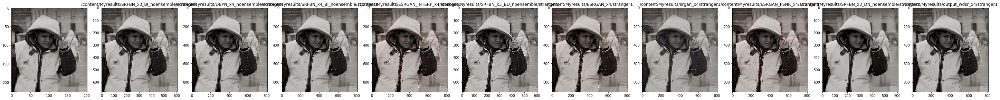

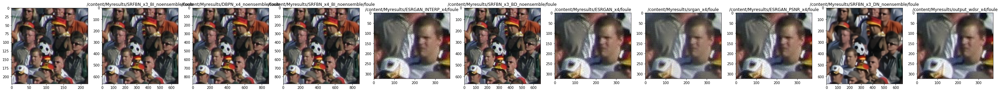

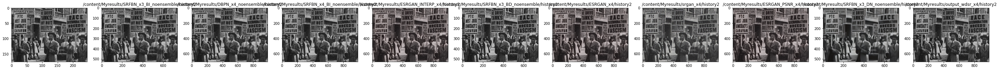

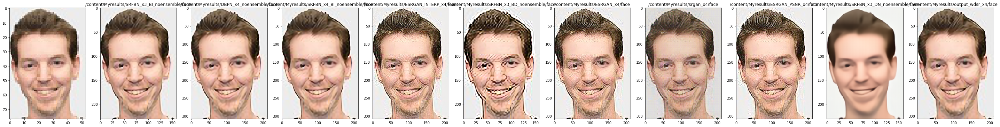

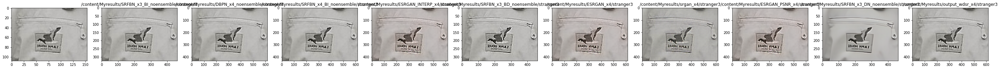

...

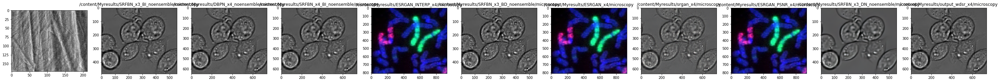

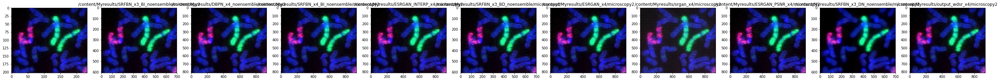

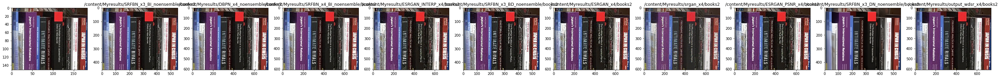

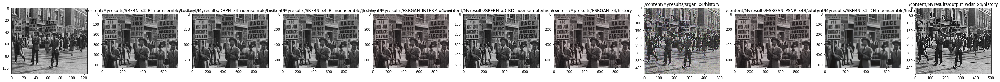

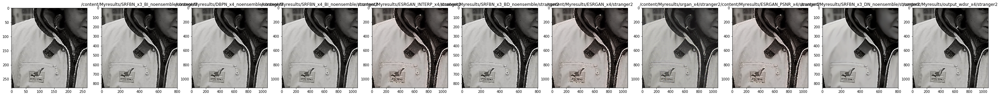

In [ ]:
import os

from IPython.display import Image, display
import PIL
import glob

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np


#modelnames = 'DBPN_x4'
#modelnames = 'SRFBN_x3'
#modelnames = 'ESRGAN'

#modelnames += '*'


#sc = 4
#ssc = str(sc)
#dirs = glob.glob('/content/Myresults/' + modelnames + '/')

dirs = glob.glob('/content/Myresults/*/')

ndir = len(dirs)

imname = '*'
orignames = glob.glob('/content/MyImages/' + imname)

for i in range(0,len(orignames)):
  
  fig, axes = plt.subplots(nrows=1, ncols=1+ndir)
  fig.set_size_inches((40,40))
  fig.tight_layout()
  
  #original
  orig = orignames[i]
  imgLr = mpimg.imread(orig)
  axes[0].imshow(imgLr)
   
  for j in range(0,len(dirs)):
    
    mydir = dirs[j]
  
    #new file
    path, file = os.path.split(orig)
    file, ext = os.path.splitext(file)
    #print(file)  
    newfile = glob.glob(mydir + file + '*')[0]

    imgRr = mpimg.imread(newfile)
    axes[1+j].imshow(imgRr)
    #if j == 0:
    axes[1+j].set_title(mydir+file)
  

  
  
  